In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!ln -s /content/gdrive/MyDrive/Tensorflow7
!ls /content/gdrive/MyDrive

Mounted at /content/gdrive
 all_names.gsheet		      Error.gdoc
 Annotation			     '[EXCLUDE]AnnotationCCTV'
 AnnotationCCTV			     'FACE RECOGNITION DOCUMENTATION.gdoc'
 Annotations2			     'Getting started.pdf'
 Annotations3			      models1.tar.gz
 Augmented			     'models_origin data_2000steps.zip'
 CLIP_20230616-111548.mp4	      models_v1.tar.gz
 CLIP_20230616-111711.mp4	      my_faster_r-cnn_resnet50_NEW.zip
 CLIP_20230616-141951.mp4	     'Nurina Rahayu_D121171003 Tugas MID SO.docx'
 CLIP_20230616-153537.mp4	     'PROGRESS SKRIPSI.pptx'
 CLIP_20230616-154021.mp4	      SKRIPSI
 CLIP_20230616-154218.mp4	     'SURAT PERNYATAAN Mahasiswa_Nurina Rahayu.pdf'
 CLIP_20230616-154607.mp4	      Tensorflow7
 CLIP_20230616-161611.mp4	     'Untitled presentation.gslides'
 CLIP_20230616-161611.mp4_fixed.mp4   working
 CNN				      working2
'Colab Notebooks'		      working3
 customTF2			      workingLabels
 DATA


In [ ]:
!pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=7314b705ce824655f8eb53ff4f708121df8fda03b7edf557031347a1e1e7972c
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
#Visiulazation
import matplotlib.pyplot as plt
#image processing
import cv2
#extracting zippped file
import tarfile
#systems
import os
import wget

### Download ModelFile And ConfigFile

In [ ]:
import wget

url = 'https://github.com/spmallick/learnopencv/raw/master/FaceDetectionComparison/models/res10_300x300_ssd_iter_140000_fp16.caffemodel'
filename = url.split('/')[-1]
wget.download(url, filename)

'res10_300x300_ssd_iter_140000_fp16.caffemodel'

In [ ]:
import wget

url = 'https://github.com/spmallick/learnopencv/raw/master/FaceDetectionComparison/models/deploy.prototxt'
filename = url.split('/')[-1]
wget.download(url, filename)

'deploy.prototxt'

### Read a image

In [ ]:
imgg="/content/gdrive/MyDrive/working3/test/Thoriq_Akbar_Virgiawan/Thoriq_Akbar_Virgiawan_0194.jpg"

In [ ]:
person=cv2.imread(imgg)

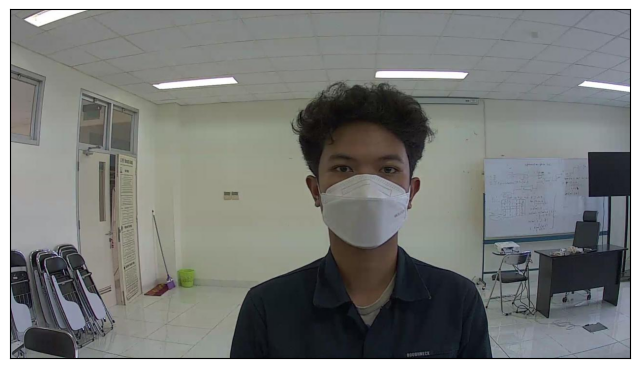

In [ ]:
def show_image(image):
    plt.figure(figsize=(8,5))
    #Before showing image, bgr color order transformed to rgb order
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([])
    plt.yticks([])
    plt.show()

show_image(person)

### Annotating Face using model and config that have been downloaded

In [ ]:
modelFile ="/content/res10_300x300_ssd_iter_140000_fp16.caffemodel"
configFile = "/content/deploy.prototxt"
net = cv2.dnn.readNetFromCaffe(configFile, modelFile)

In [ ]:
#function to extract box dimensions
def face_dnn(img, coord=False):
    blob = cv2.dnn.blobFromImage(img, 1, (224,224), [104, 117, 123], False, False) #
    # params: source, scale=1, size=300,300, mean RGB values (r,g,b), rgb swapping=false, crop = false
    conf_threshold=0.8 # confidence at least 60%
    frameWidth=img.shape[1] # get image width
    frameHeight=img.shape[0] # get image height
    max_confidence=0
    net.setInput(blob)
    detections = net.forward()
    detection_index=0
    bboxes = []

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:

            if max_confidence < confidence: # only show maximum confidence face
                max_confidence = confidence
                detection_index = i
    i=detection_index
    x1 = int(detections[0, 0, i, 3] * frameWidth)
    y1 = int(detections[0, 0, i, 4] * frameHeight)
    x2 = int(detections[0, 0, i, 5] * frameWidth)
    y2 = int(detections[0, 0, i, 6] * frameHeight)
    cv2.rectangle(img,(x1,y1),(x2,y2),(255,255,0),2)
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if coord==True:
        return x1, y1, x2, y2
    return cv_rgb

For multiple faces in a image

In [ ]:
#gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
# multiple faces needs increasing the size of image as well as multiple detections
def nfaces_dnn(img):
    blob = cv2.dnn.blobFromImage(img, 1.2, (1200,1200), [104, 117, 123], False, False) #
    # params: source, scale=1, size=300,300, mean RGB values (r,g,b), rgb swapping=false, crop = false
    conf_threshold=0.6 # confidence at least 60%
    frameWidth=img.shape[1] # get image width
    frameHeight=img.shape[0] # get image height
    net.setInput(blob)
    detections = net.forward()

    bboxes = []

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:

            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            cv2.rectangle(img,(x1,y1),(x2,y2),(255,255,0),2)
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv_rgb

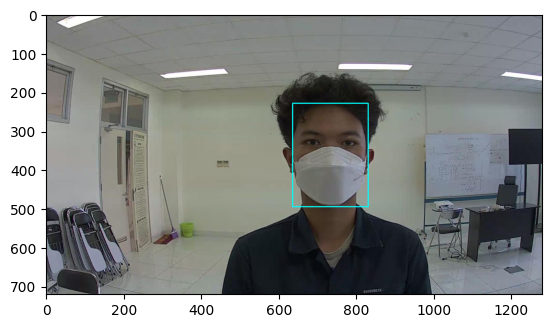

In [ ]:
a=face_dnn(person)
plt.imshow(a)
plt.show()

### Annotating Multiple Images

Processing image: Eliezer_Render_Rambupadang_0001.jpg


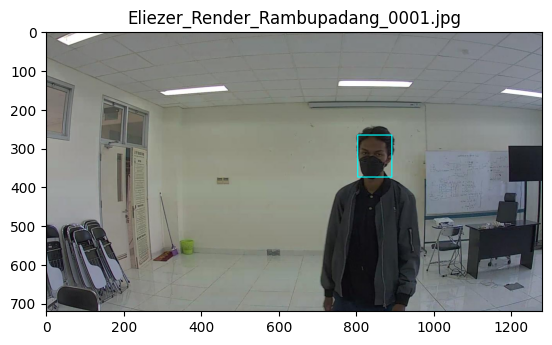

Processing image: Eliezer_Render_Rambupadang_0002.jpg


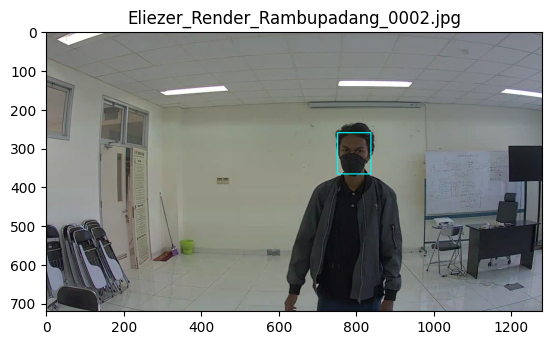

Processing image: Eliezer_Render_Rambupadang_0004.jpg


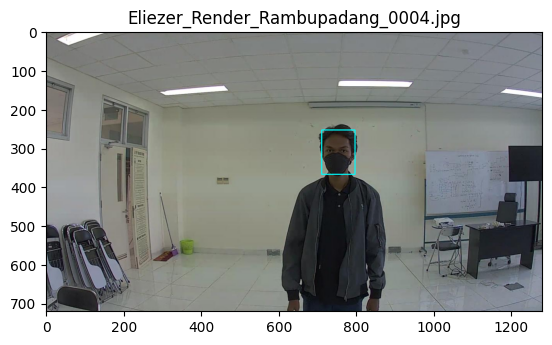

Processing image: Eliezer_Render_Rambupadang_0005.jpg


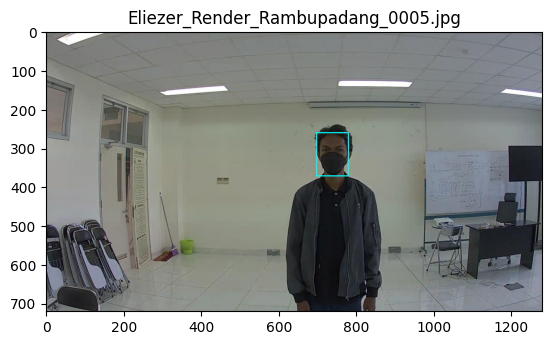

Processing image: Eliezer_Render_Rambupadang_0006.jpg


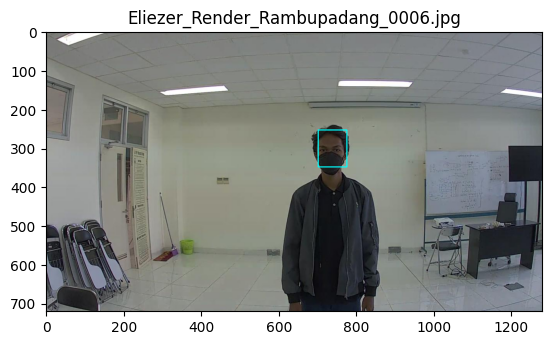

Processing image: Eliezer_Render_Rambupadang_0010.jpg


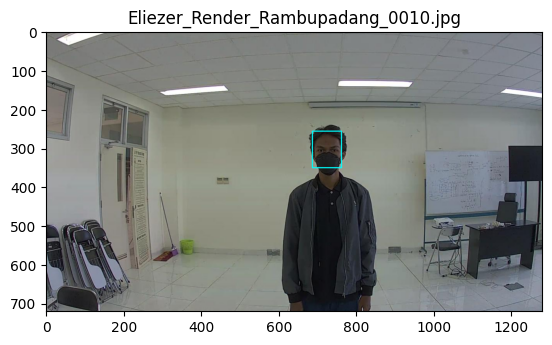

Processing image: Eliezer_Render_Rambupadang_0012.jpg


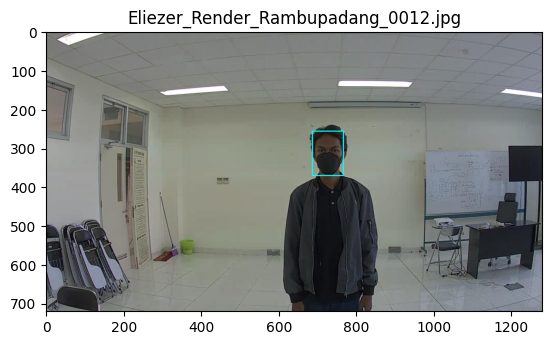

Processing image: Eliezer_Render_Rambupadang_0013.jpg


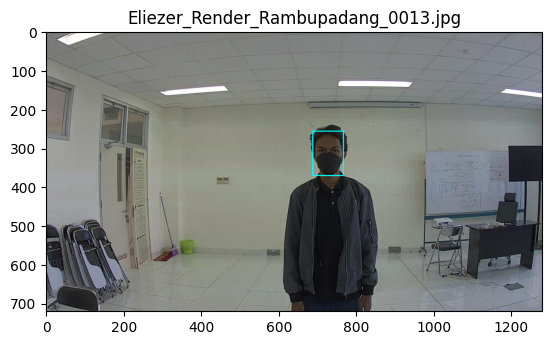

Processing image: Eliezer_Render_Rambupadang_0014.jpg


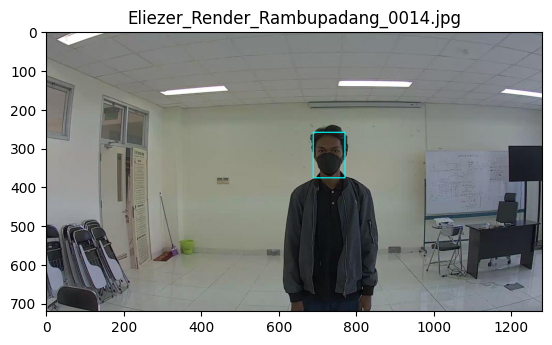

Processing image: Eliezer_Render_Rambupadang_0015.jpg


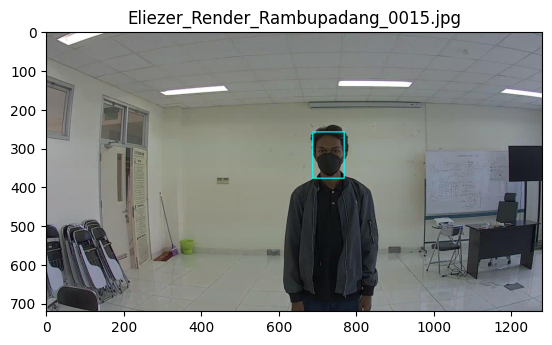

Processing image: Eliezer_Render_Rambupadang_0016.jpg


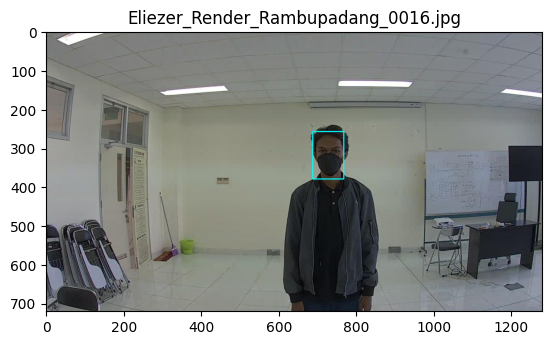

Processing image: Eliezer_Render_Rambupadang_0017.jpg


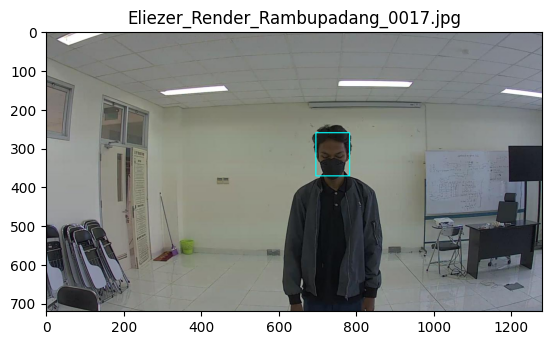

Processing image: Eliezer_Render_Rambupadang_0018.jpg


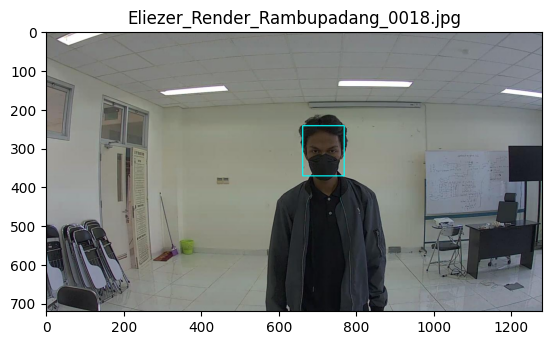

Processing image: Eliezer_Render_Rambupadang_0019.jpg


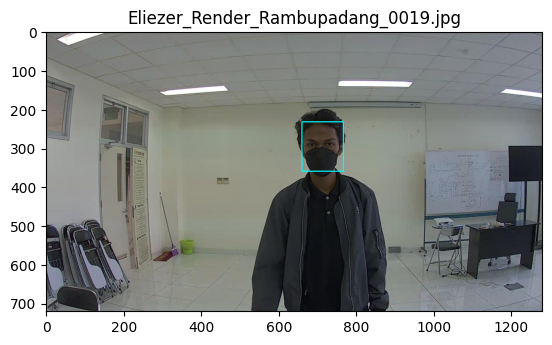

Processing image: Eliezer_Render_Rambupadang_0021.jpg


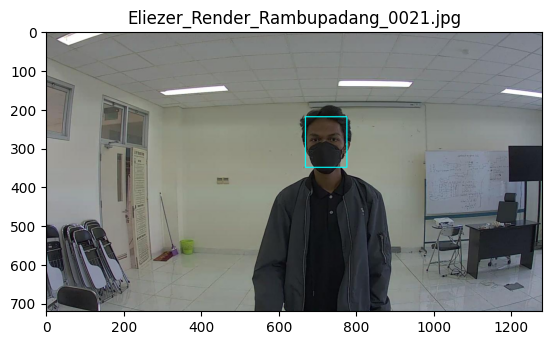

Processing image: Eliezer_Render_Rambupadang_0023.jpg


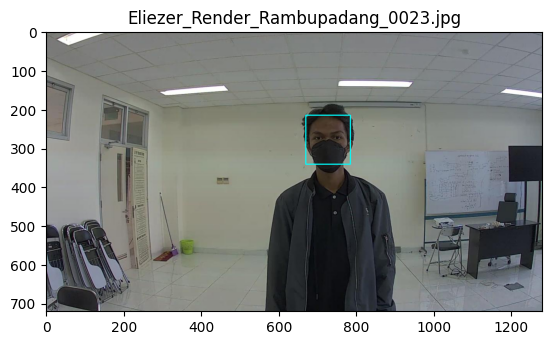

Processing image: Eliezer_Render_Rambupadang_0025.jpg


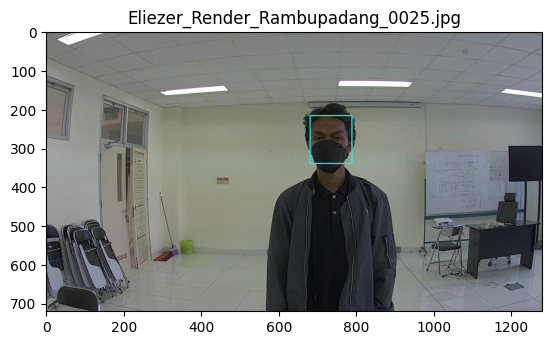

Processing image: Eliezer_Render_Rambupadang_0027.jpg


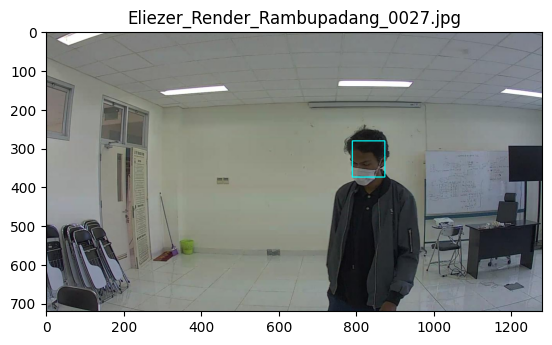

Processing image: Eliezer_Render_Rambupadang_0028.jpg


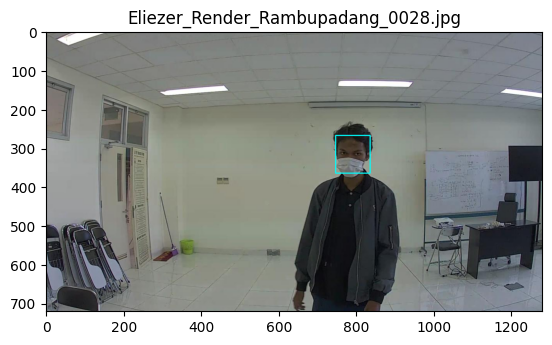

Processing image: Eliezer_Render_Rambupadang_0029.jpg


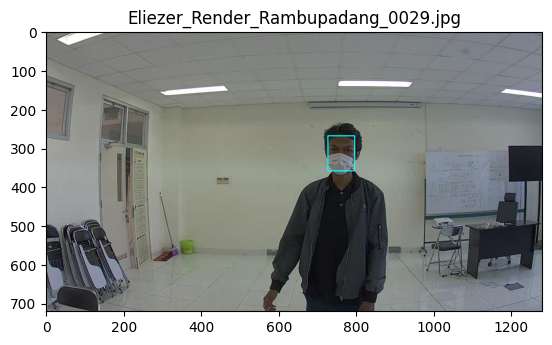

Processing image: Eliezer_Render_Rambupadang_0030.jpg


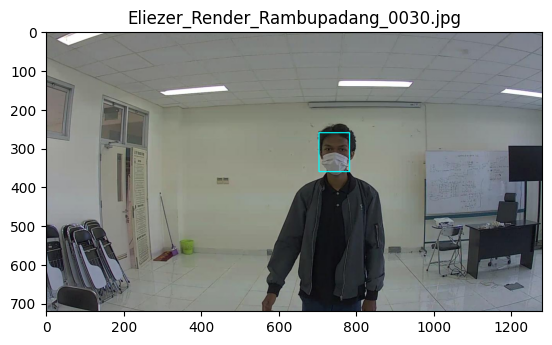

Processing image: Eliezer_Render_Rambupadang_0032.jpg


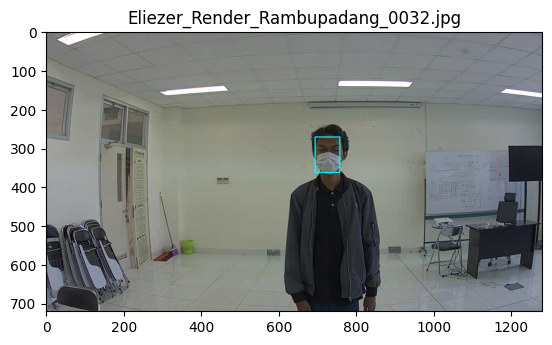

Processing image: Eliezer_Render_Rambupadang_0033.jpg


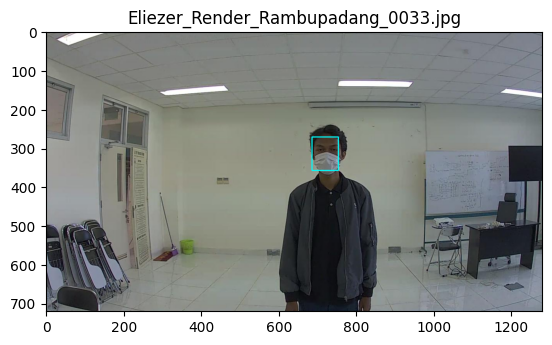

Processing image: Eliezer_Render_Rambupadang_0034.jpg


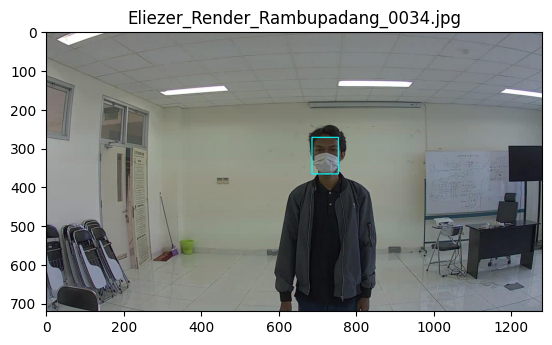

Processing image: Eliezer_Render_Rambupadang_0035.jpg


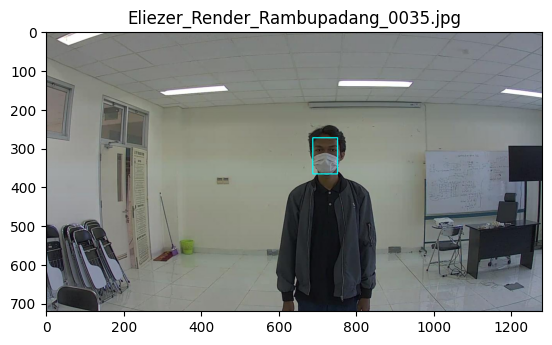

Processing image: Eliezer_Render_Rambupadang_0036.jpg


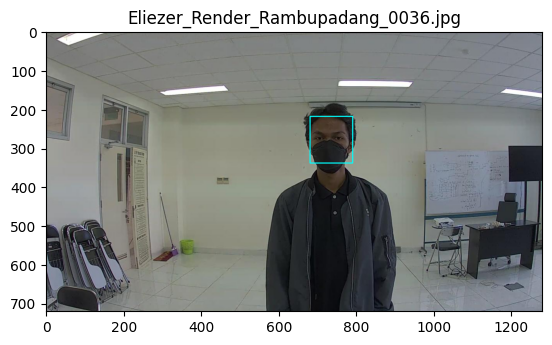

Processing image: Eliezer_Render_Rambupadang_0037.jpg


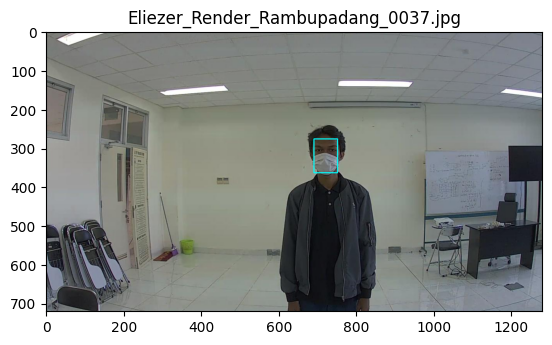

Processing image: Eliezer_Render_Rambupadang_0038.jpg


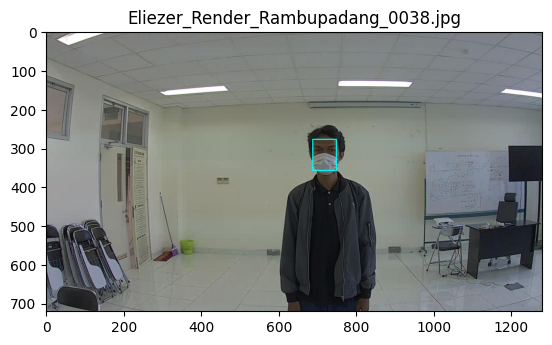

Processing image: Eliezer_Render_Rambupadang_0039.jpg


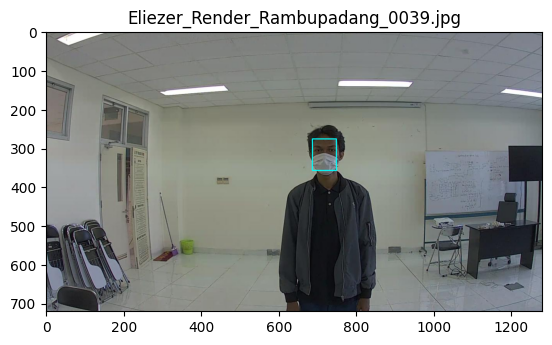

Processing image: Eliezer_Render_Rambupadang_0040.jpg


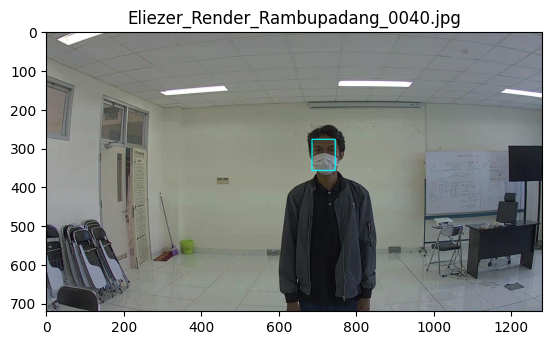

Processing image: Eliezer_Render_Rambupadang_0041.jpg


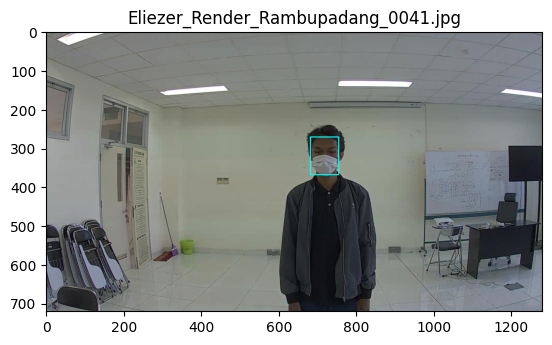

Processing image: Eliezer_Render_Rambupadang_0042.jpg


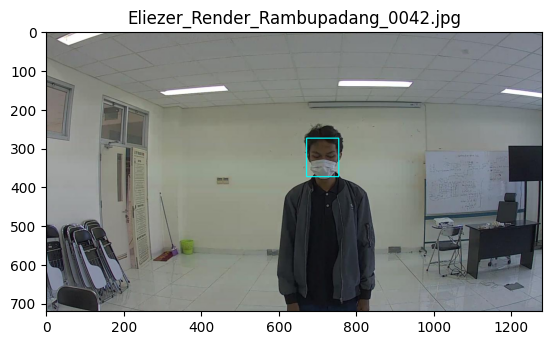

Processing image: Eliezer_Render_Rambupadang_0043.jpg


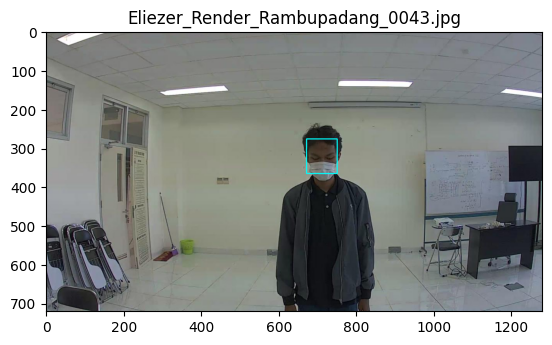

Processing image: Eliezer_Render_Rambupadang_0044.jpg


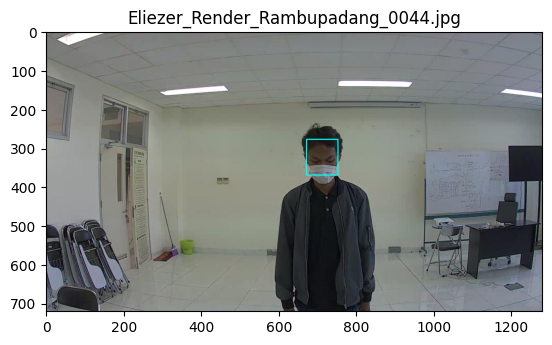

Processing image: Eliezer_Render_Rambupadang_0045.jpg


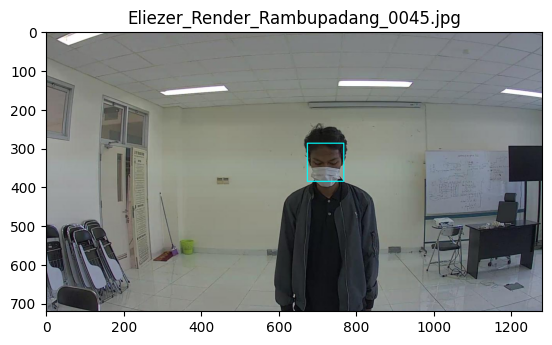

Processing image: Eliezer_Render_Rambupadang_0046.jpg


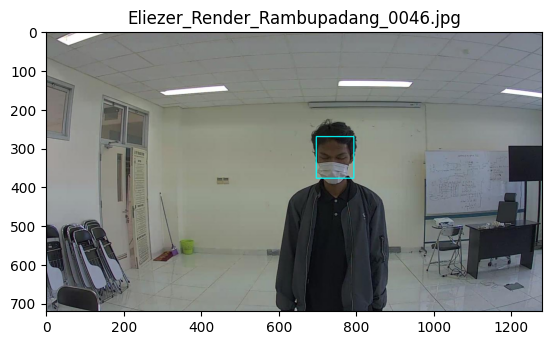

Processing image: Eliezer_Render_Rambupadang_0047.jpg


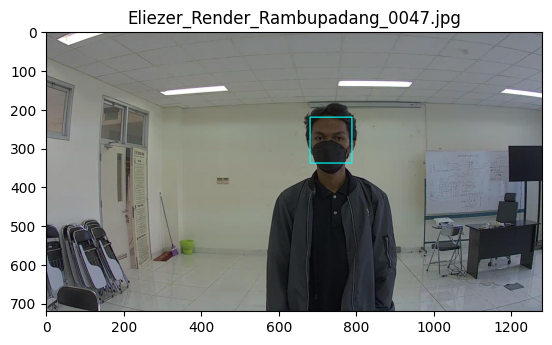

Processing image: Eliezer_Render_Rambupadang_0048.jpg


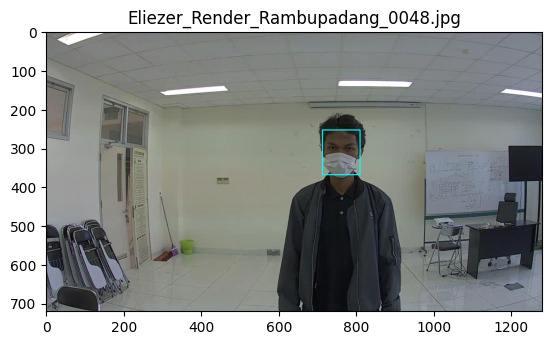

Processing image: Eliezer_Render_Rambupadang_0049.jpg


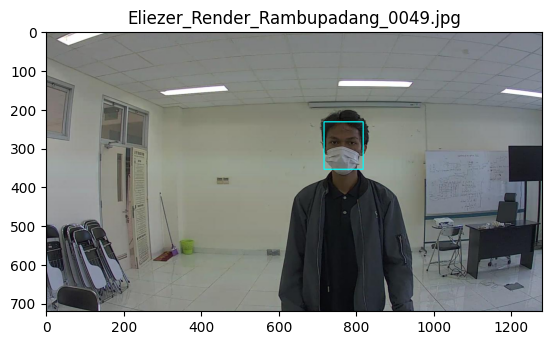

Processing image: Eliezer_Render_Rambupadang_0050.jpg


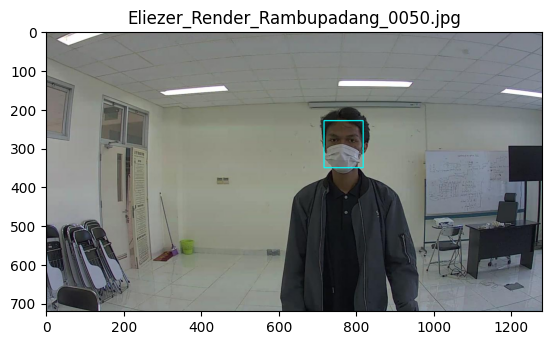

Processing image: Eliezer_Render_Rambupadang_0051.jpg


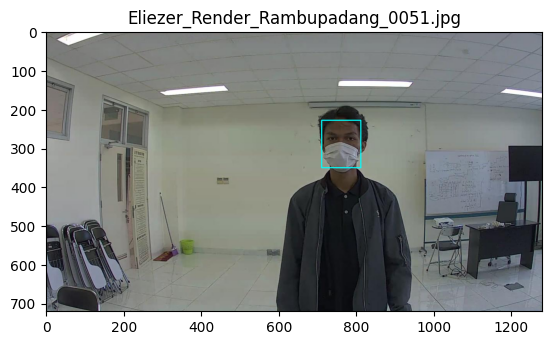

Processing image: Eliezer_Render_Rambupadang_0052.jpg


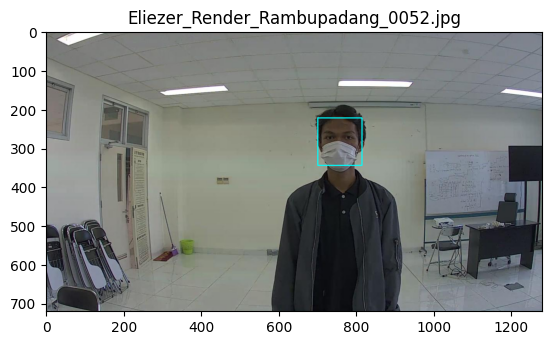

Processing image: Eliezer_Render_Rambupadang_0053.jpg


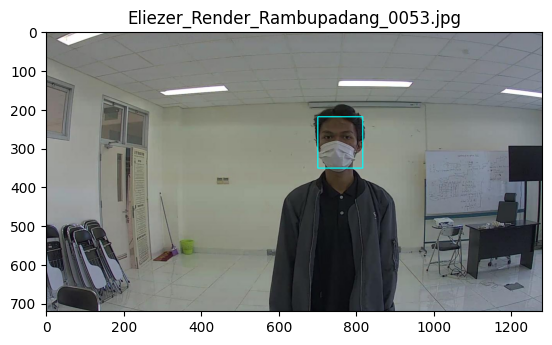

Processing image: Eliezer_Render_Rambupadang_0055.jpg


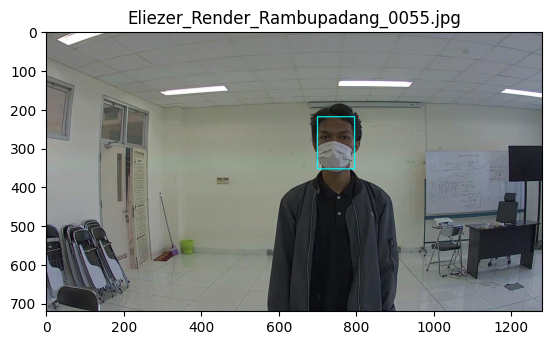

Processing image: Eliezer_Render_Rambupadang_0056.jpg


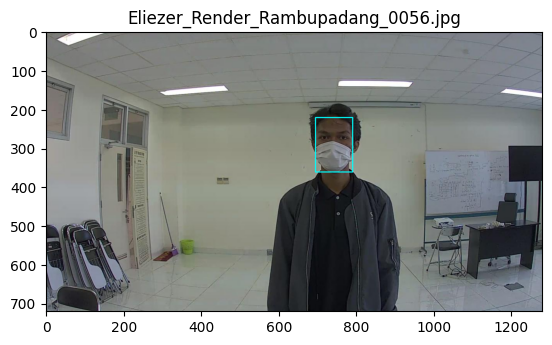

Processing image: Eliezer_Render_Rambupadang_0058.jpg


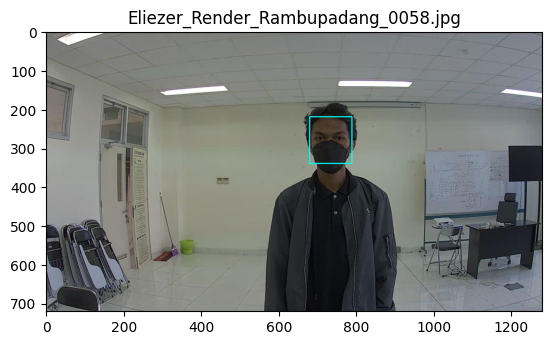

Processing image: Eliezer_Render_Rambupadang_0059.jpg


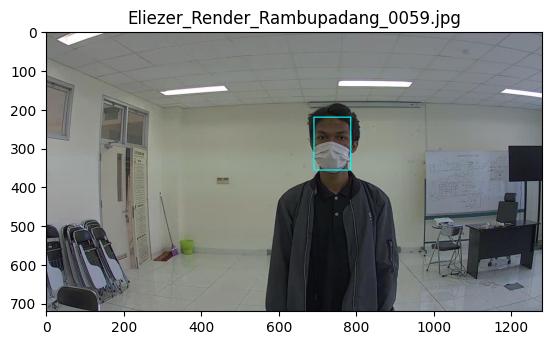

Processing image: Eliezer_Render_Rambupadang_0062.jpg


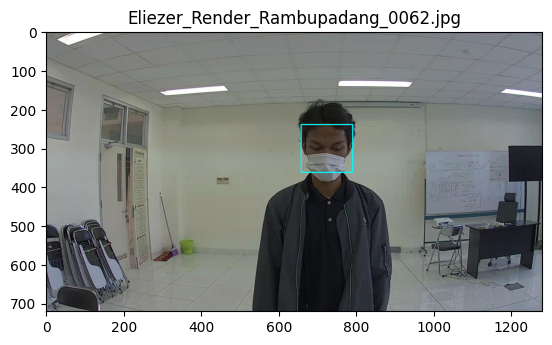

Processing image: Eliezer_Render_Rambupadang_0063.jpg


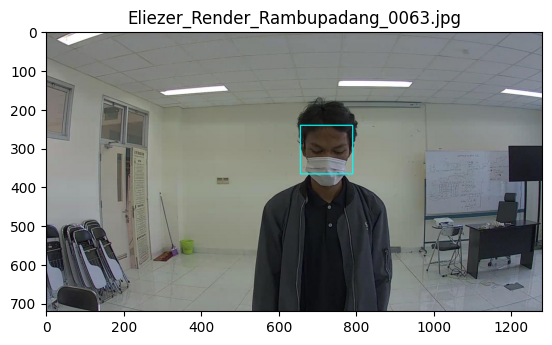

Processing image: Eliezer_Render_Rambupadang_0065.jpg


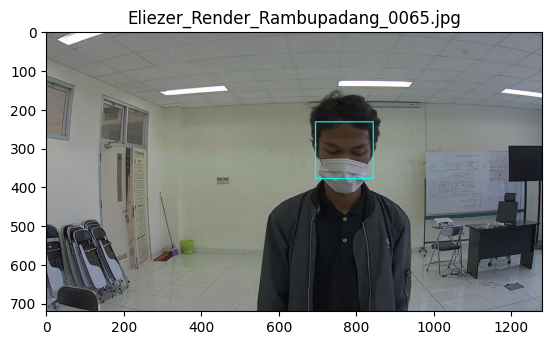

Processing image: Eliezer_Render_Rambupadang_0066.jpg


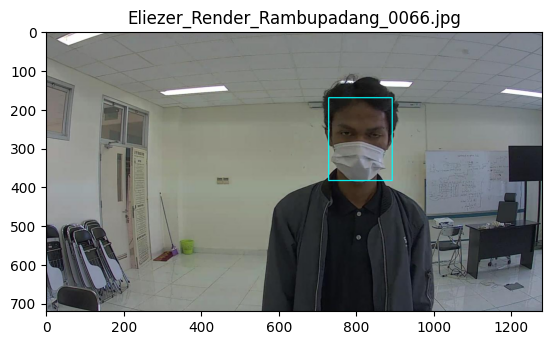

Processing image: Eliezer_Render_Rambupadang_0067.jpg


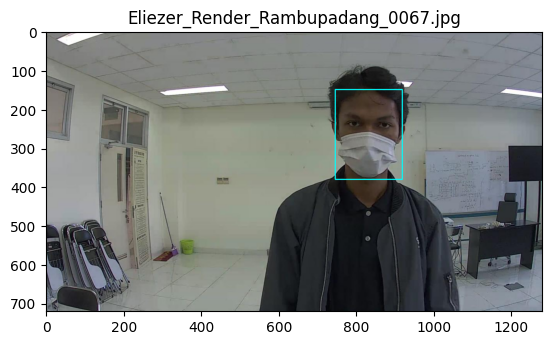

Processing image: Eliezer_Render_Rambupadang_0068.jpg


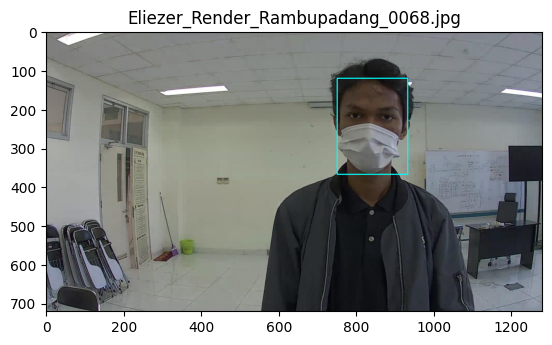

Processing image: Eliezer_Render_Rambupadang_0069.jpg


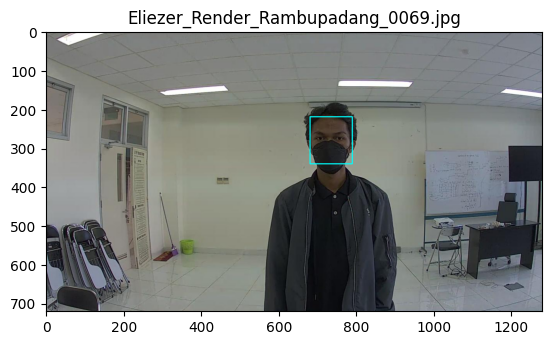

Processing image: Eliezer_Render_Rambupadang_0070.jpg


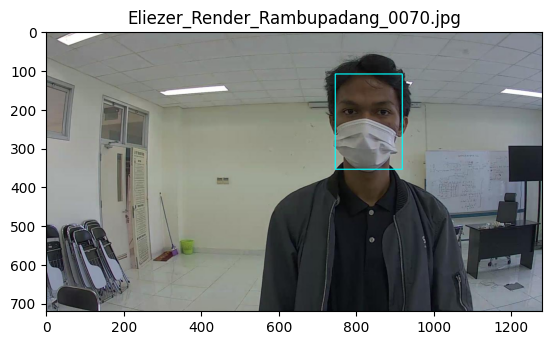

Processing image: Eliezer_Render_Rambupadang_0071.jpg


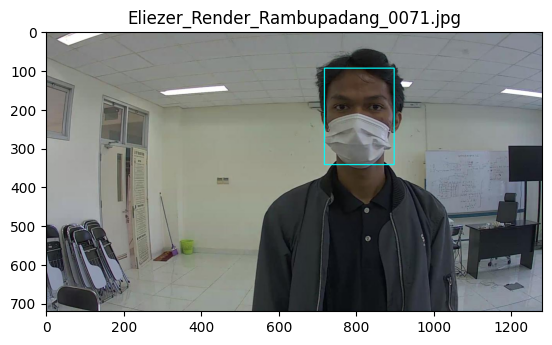

Processing image: Eliezer_Render_Rambupadang_0072.jpg


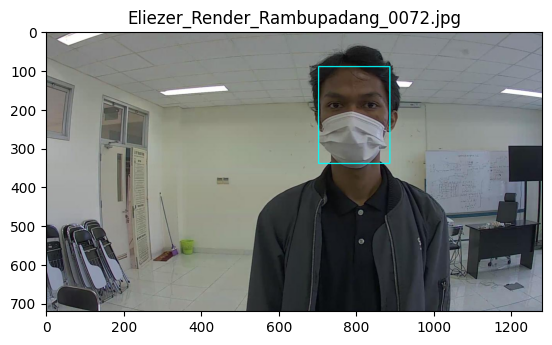

Processing image: Eliezer_Render_Rambupadang_0073.jpg


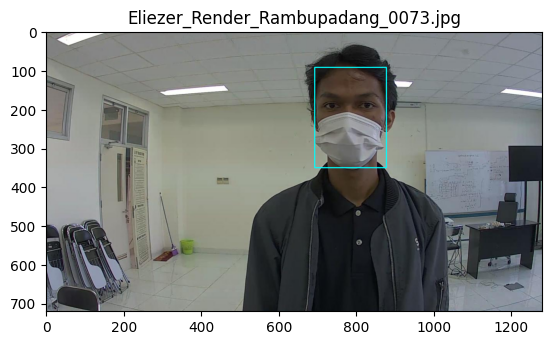

Processing image: Eliezer_Render_Rambupadang_0074.jpg


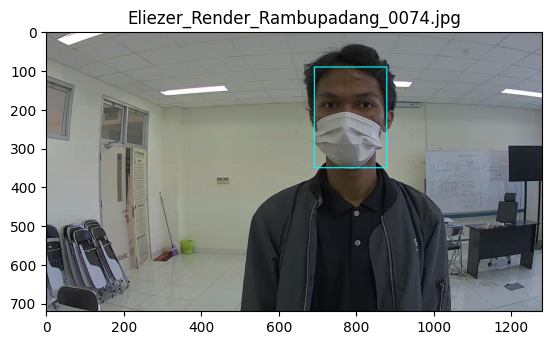

Processing image: Eliezer_Render_Rambupadang_0075.jpg


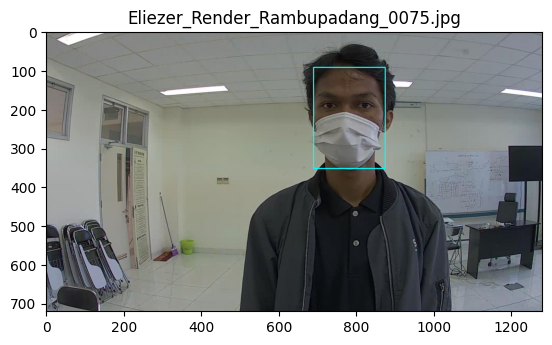

Processing image: Eliezer_Render_Rambupadang_0076.jpg


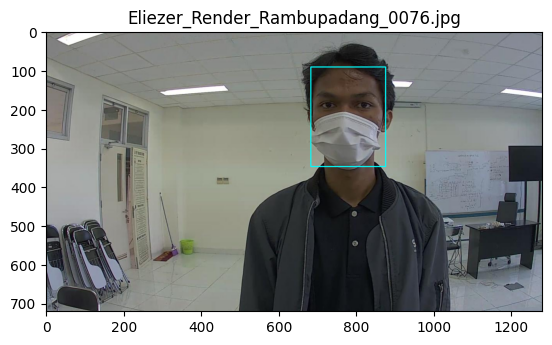

Processing image: Eliezer_Render_Rambupadang_0077.jpg


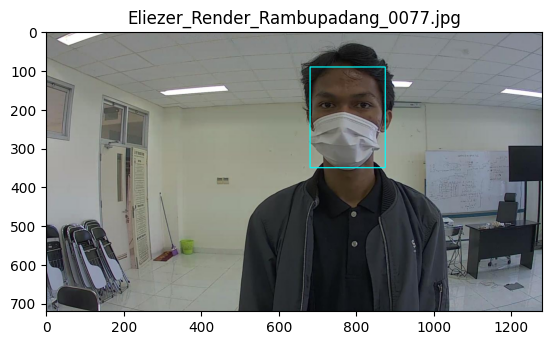

Processing image: Eliezer_Render_Rambupadang_0079.jpg


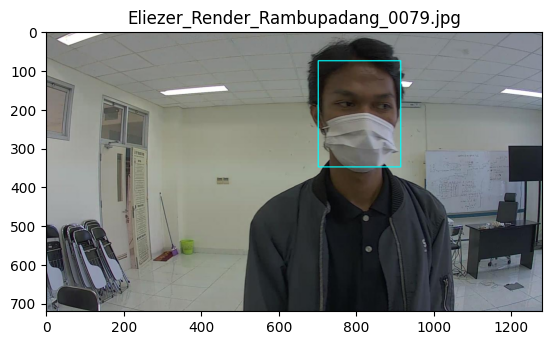

Processing image: Eliezer_Render_Rambupadang_0080.jpg


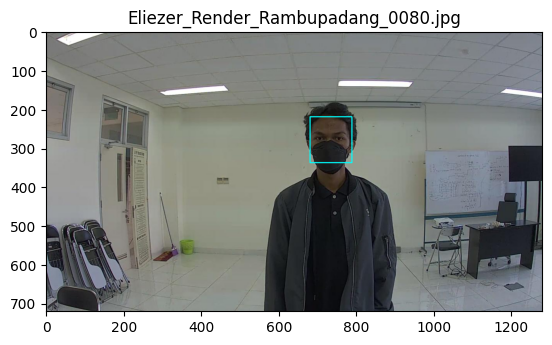

Processing image: Eliezer_Render_Rambupadang_0082.jpg


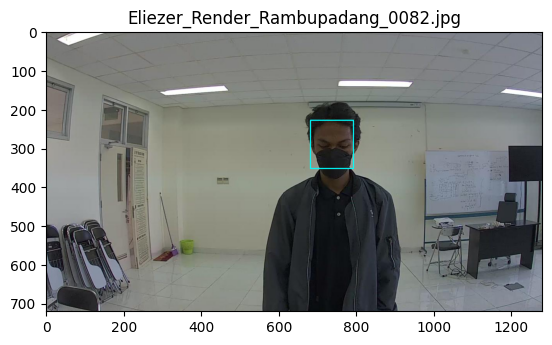

Processing image: Eliezer_Render_Rambupadang_0083.jpg


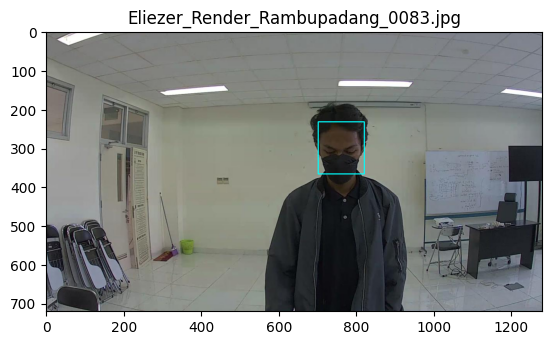

Processing image: Eliezer_Render_Rambupadang_0084.jpg


KeyboardInterrupt: ignored

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import urllib.request
import os
import glob

# Function to load image files
def load_image_files(directory_path):
    return sorted(glob.glob(os.path.join(directory_path, '*.jpg')))

# Your download_file and other code remains the same

# Load the image files
image_files = load_image_files('/content/gdrive/MyDrive/Annotations2/Thoriq_Akbar_Virgiawan')

for image_file in image_files:
    img_name = os.path.basename(image_file)
    print(f"Processing image: {img_name}")
    person = cv2.imread(image_file)

    # Your face_dnn and other code remains the same

    a = face_dnn(person)
    plt.imshow(a)
    plt.title(img_name)
    plt.show()

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import urllib.request
import os
import glob

# Your download_file and other code remains the same

# Load the image files
image_files = glob.glob('/content/gdrive/MyDrive/Annotations2/Eliezer_Render_Rambupadang/*.jpg')

for image_file in image_files:
    person = cv2.imread(image_file)

    # Your face_dnn and other code remains the same

    a = face_dnn(person)
    plt.imshow(a)
    plt.show()

### Making XML File based on bounding box output as box coordinate and folder's name as label

In [ ]:
# from xml.etree.ElementTree import Element, ElementTree, SubElement
# import cv2
# import os

# def create_xml(image_file, label, xmin, ymin, xmax, ymax):
#     root = Element('annotation')
#     tree = ElementTree(root)

#     # Add file name to annotation
#     file_name = Element('filename')
#     file_name.text = os.path.basename(image_file)
#     root.append(file_name)

#     # Add size (width, height, depth) to annotation
#     size = Element('size')
#     width = Element('width')
#     width.text = str(xmax - xmin)
#     height = Element('height')
#     height.text = str(ymax - ymin)
#     depth = Element('depth')
#     depth.text = str(3) # Assuming the images are RGB
#     size.append(width)
#     size.append(height)
#     size.append(depth)
#     root.append(size)

#     # Add object to annotation
#     object = Element('object')
#     name = Element('name')
#     name.text = label
#     object.append(name)
#     root.append(object)

#     # Add bounding box to object
#     bndbox = Element('bndbox')
#     xmin_element = Element('xmin')
#     xmin_element.text = str(xmin)
#     ymin_element = Element('ymin')
#     ymin_element.text = str(ymin)
#     xmax_element = Element('xmax')
#     xmax_element.text = str(xmax)
#     ymax_element = Element('ymax')
#     ymax_element.text = str(ymax)
#     bndbox.append(xmin_element)
#     bndbox.append(ymin_element)
#     bndbox.append(xmax_element)
#     bndbox.append(ymax_element)
#     object.append(bndbox)

#     # Write XML file
#     xml_file = image_file.replace('.jpg', '.xml').replace('.png', '.xml')
#     tree.write(xml_file)

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import urllib.request
import os
import glob

In [ ]:
from xml.etree.ElementTree import Element, ElementTree, SubElement
from os.path import basename

def create_xml(image_file, label, xmin, ymin, xmax, ymax):
    root = Element('annotation')
    tree = ElementTree(root)

    # Add file name to annotation
    file_name = SubElement(root, 'filename')
    file_name.text = basename(image_file)

    # Add size (width, height, depth) to annotation
    size = SubElement(root, 'size')
    width = SubElement(size, 'width')
    width.text = str(xmax - xmin)
    height = SubElement(size, 'height')
    height.text = str(ymax - ymin)
    depth = SubElement(size, 'depth')
    depth.text = str(3) # Assuming the images are RGB

    # Add object to annotation
    object = SubElement(root, 'object')
    name = SubElement(object, 'name')
    name.text = label

    # Add bounding box to object
    bndbox = SubElement(object, 'bndbox')
    xmin_element = SubElement(bndbox, 'xmin')
    xmin_element.text = str(xmin)
    ymin_element = SubElement(bndbox, 'ymin')
    ymin_element.text = str(ymin)
    xmax_element = SubElement(bndbox, 'xmax')
    xmax_element.text = str(xmax)
    ymax_element = SubElement(bndbox, 'ymax')
    ymax_element.text = str(ymax)

    # Write XML file
    xml_file = image_file.replace('.jpg', '.xml').replace('.png', '.xml')
    tree.write(xml_file)

In [ ]:
def main():
    image_path = '/content/gdrive/MyDrive/Annotation/Thoriq_Akbar_Virgiawan'
    for root, dirs, files in os.walk(image_path):
        for file in files:
            if file.endswith('.jpg') or file.endswith('.png'):
                image_file = os.path.join(root, file)
                image = cv2.imread(image_file)
                xmin, ymin, xmax, ymax = face_dnn(image, coord=True)
                label = root.split(os.path.sep)[-1]
                create_xml(image_file, label, xmin, ymin, xmax, ymax)

if __name__ == '__main__':
    main()

### Making CSV file

In [ ]:
import cv2
import os
import pandas as pd
from pathlib import Path
import csv

# Function to create CSV file
def create_csv(data, filename):
    # Open a new csv file and overwrite any existing file
    with open(os.path.join(directory_path, filename), 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerows(data)

# Initialize CSV file with header
csv_data = [["filename", "label", "xmin", "ymin", "xmax", "ymax"]]

# Specify directory path
directory_path = '/content/gdrive/MyDrive/Annotations3/Mohammad_Aqsha_Arianto_Latief'

# Loop through subdirectories (label)
for subdir, dirs, files in os.walk(directory_path):
    for file in files:
        if file.endswith('.jpg') or file.endswith('.png'):
            img_path = os.path.join(subdir, file)
            label = os.path.basename(subdir)
            img = cv2.imread(img_path)
            x1, y1, x2, y2 = face_dnn(img, coord=True)
            img_name = os.path.basename(img_path) # Get the image name only
            img_data = [img_name, label, x1, y1, x2, y2]
            csv_data.append(img_data)

# Create CSV file
create_csv(csv_data, '/content/gdrive/MyDrive/Annotations3/filename_label_coordinates_Herdiansyah.csv')

In [ ]:
#delete all csv
import glob
import os

def delete_all_csv_files(folder_path):
    for filename in glob.glob(os.path.join(folder_path, '*.csv')):
        os.remove(filename)

delete_all_csv_files('/content/gdrive/MyDrive/Annotations2/Eliezer_Render_Rambupadang')

### Extracted for face detection

In [ ]:
len(os.listdir('/content/gdrive/MyDrive/Annotations2/')) # total number of folders (people)

5

In [ ]:
# total number of images
total = sum([len(files) for r, d, files in os.walk('/content/gdrive/MyDrive/Annotations2/')])
print(total)

1914


In [ ]:
count=0
imglist=[]
#
for r, d, files in os.walk('/content/gdrive/MyDrive/Annotations2/'):
    if len(files)>=20:
        imglist.append(r)
        #print(count, r)
        count+=1 # counts how many folders have with at least 20 images
print(count)

5


In [ ]:
#os.listdir(imglist[0])
# pick one random photo
a=np.random.randint(0,20)
b=np.random.randint(0,6)
imglist[b]

'/content/gdrive/MyDrive/Annotations2/Thoriq_Akbar_Virgiawan'

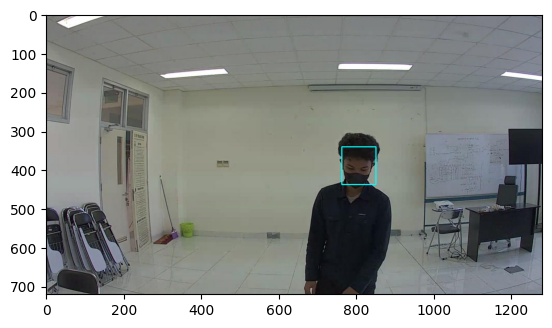

In [ ]:
# show the random photo with face detected
img=imglist[b]+'/'+os.listdir(imglist[b])[a]
img=cv2.imread(img)
c=face_dnn(img)
plt.imshow(c)
plt.show()

### Creating training and test sets

In [ ]:
#remove unused folders
import shutil
pathd='/content/gdrive/MyDrive/Annotations2/'
#shutil.rmtree(os.path.realpath('LFW'))
for dirs in os.listdir(pathd):
    if not (pathd+dirs) in imglist:
        shutil.rmtree(os.path.realpath(pathd+dirs))

In [ ]:
dirs=os.listdir(pathd)
dirs.sort()

Muh_Wira_Ramadhani
713 324 788 419


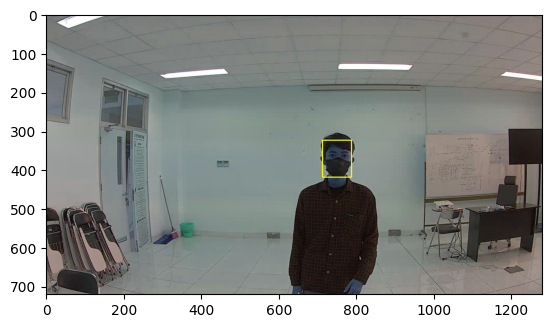

Muh_Wira_Ramadhani
728 333 799 417


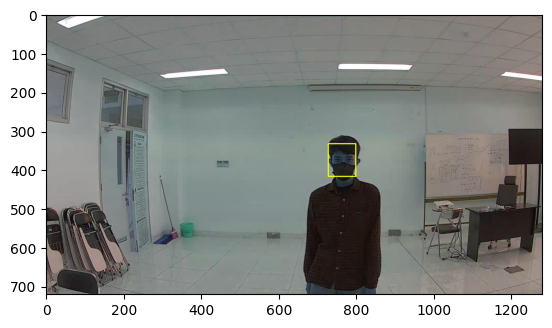

Muh_Wira_Ramadhani
954 346 1015 423


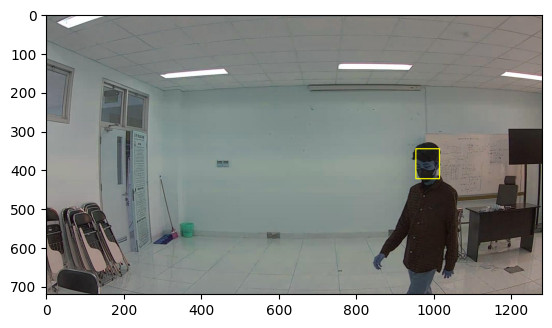

Muh_Wira_Ramadhani
692 321 766 423


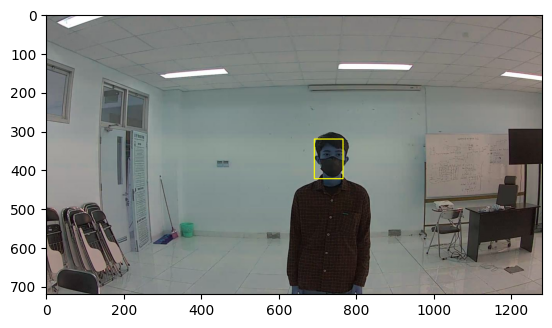

Muh_Wira_Ramadhani
690 323 759 424


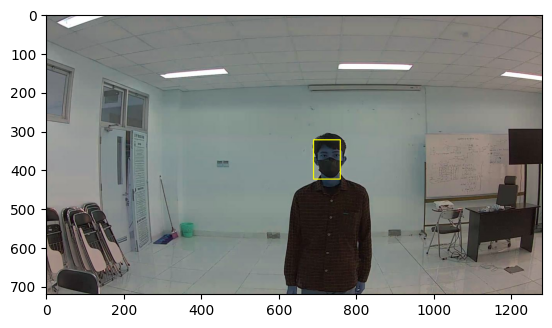

In [ ]:
#example of box coordinates
#a=np.random.randint(0,20)
b=np.random.randint(0,6)
for img in os.listdir(pathd+dirs[b])[:5]:
    #print(pathd+dirs[0]+'/'+img)
    print(dirs[b])
    img=cv2.imread(pathd+dirs[b]+'/'+img)
    x1, y1, x2, y2=face_dnn(img, True)
    #print coordinates of the detected face
    print(x1, y1, x2, y2)
    plt.imshow(img)
    plt.show()

In [ ]:
os.listdir('/content/gdrive/MyDrive/')
pathd
#(os.listdir(pathd))

'/content/gdrive/MyDrive/Annotations2/'

In [ ]:
# # creating test and train set
from numpy import random
datadir='/content/gdrive/MyDrive/working3/'
train=datadir+'train/'
test=datadir+'test/'

if not os.path.exists(train):
    os.mkdir(train)
if not os.path.exists(test):
    os.mkdir(test)

for dirs in os.listdir(pathd):
    filenames = os.listdir(pathd+dirs)
    filenames.sort()  # make sure that the filenames have a fixed order before shuffling
    random.seed(402)
    random.shuffle(filenames) # shuffles the ordering of filenames (deterministic given the chosen seed)
    split = int(0.85 * len(filenames))
    train_filenames = filenames[:split] # splitting filenames into two parts
    test_filenames = filenames[split:]
    for img in train_filenames:
        full_file_name = os.path.join(pathd+dirs, img)
        cur_dir=os.path.join(train+dirs)
        #print(cur_dir)
        if not os.path.exists(cur_dir): # create this current person's folder for training
            os.mkdir(cur_dir)
        shutil.copy(full_file_name, cur_dir)
    for img in test_filenames:
        full_file_name = os.path.join(pathd+dirs, img)
        cur_dir=os.path.join(test+dirs)
        if not os.path.exists(cur_dir): # create this current person's folder for testing
            os.mkdir(cur_dir)
        shutil.copy(full_file_name, cur_dir)
        #a=full_file_name+' '+test+dirs
#shutil.rmtree('/content/gdrive/MyDrive/Annotation2/')

In [ ]:
from numpy import random
datadir='/content/gdrive/MyDrive/Annotation2/'
train=datadir+'train/'
test=datadir+'test/'

if not os.path.exists(train):
    os.mkdir(train)
if not os.path.exists(test):
    os.mkdir(test)

FileNotFoundError: ignored

In [ ]:
for dirs in os.listdir(pathd):
    filenames = os.listdir(pathd+dirs)
    filenames.sort() # make sure that the filenames have a fixed order before shuffling
    random.seed(402)
    random.shuffle(filenames) # shuffles the ordering of filenames (deterministic given the chosen seed)
    split = int(0.85 * len(filenames))
    train_filenames = filenames[:split] # splitting filenames into two parts
    test_filenames = filenames[split:]
    for img in train_filenames:
        full_file_name = os.path.join(pathd+dirs, img)
        cur_dir=os.path.join(train+dirs)
        #print(cur_dir)
        if not os.path.exists(cur_dir): # create this current person's folder for training
            os.mkdir(cur_dir)
        if os.path.isfile(full_file_name): # only copy if full_file_name is a file, not a directory
            shutil.copy(full_file_name, cur_dir)
    for img in test_filenames:
        full_file_name = os.path.join(pathd+dirs, img)
        cur_dir=os.path.join(test+dirs)
        if not os.path.exists(cur_dir): # create this current person's folder for testing
            os.mkdir(cur_dir)
        if os.path.isfile(full_file_name): # only copy if full_file_name is a file, not a directory
            shutil.copy(full_file_name, cur_dir)

In [ ]:
# total number of images left
total = sum([len(files) for r, d, files in os.walk(datadir)])
print(total)

2056


In [ ]:
labeldir="Labels/" # labels dir
wdir="/content/gdrive/MyDrive/working3/"
lab=wdir+labeldir
if not os.path.exists(lab):
    os.mkdir(lab)

In [ ]:
# function for creating box labels as txt file
def label_txt(pathdr, lab_dir):
    for fol in os.listdir(pathdr):
        tfile = open(lab_dir+fol+".txt","w+")
        for img in os.listdir(pathdr+fol):
            pathimg=os.path.join(pathdr+fol, img)
            #print(pathimg)
            pic=cv2.imread(pathimg)
            x1, y1, x2, y2=face_dnn(pic, True) # face detection and then saving into txt file
            tfile.write(img+' '+str(x1)+' '+str(x2)+' '+str(y1)+' '+str(y2)+'\n')
        tfile.close()
    print('Saved')

In [ ]:
lab_dir=lab+'train/'
os.mkdir(lab_dir)
label_txt(train, lab_dir)

lab_dir=lab+'test/'
os.mkdir(lab_dir)
label_txt(test, lab_dir)

error: ignored

In [ ]:
#let's check if txt files are correct:
f2 = open("/content/gdrive/MyDrive/working/Labels/test/Eliezer_Render_Rambupadang.txt","r")
print(f2.read())
f2.close()

Eliezer_Render_Rambupadang_0135.jpg 689 803 217 353
Eliezer_Render_Rambupadang_0060.jpg 680 791 223 336
Eliezer_Render_Rambupadang_0030.jpg 704 783 261 361
Eliezer_Render_Rambupadang_0226.jpg 653 753 238 368
Eliezer_Render_Rambupadang_0177.jpg 688 764 267 374
Eliezer_Render_Rambupadang_0228.jpg 663 762 231 364
Eliezer_Render_Rambupadang_0314.jpg 671 756 271 369
Eliezer_Render_Rambupadang_0020.jpg 657 767 223 365
Eliezer_Render_Rambupadang_0263.jpg 671 776 246 360
Eliezer_Render_Rambupadang_0085.jpg 715 846 241 392
Eliezer_Render_Rambupadang_0053.jpg 701 817 220 352
Eliezer_Render_Rambupadang_0077.jpg 681 875 92 351
Eliezer_Render_Rambupadang_0166.jpg 696 764 268 367
Eliezer_Render_Rambupadang_0247.jpg 698 782 258 353
Eliezer_Render_Rambupadang_0191.jpg 664 780 221 346
Eliezer_Render_Rambupadang_0284.jpg 617 812 91 345
Eliezer_Render_Rambupadang_0022.jpg 672 784 219 339
Eliezer_Render_Rambupadang_0168.jpg 680 766 260 379
Eliezer_Render_Rambupadang_0339.jpg 675 811 212 375
Eliezer_Render

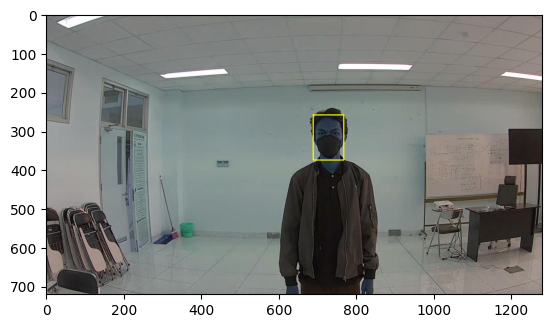

In [ ]:
# checking Arnold_Schwarzenegger_0041.jpg
pic=cv2.imread(test+'Eliezer_Render_Rambupadang/Eliezer_Render_Rambupadang_0007.jpg')
cv2.rectangle(pic,(689 ,259),(768,375),(255,255,0),2)
plt.imshow(pic)
plt.show()

In [ ]:
f2 = open("/content/gdrive/MyDrive/working3/Labels/test/Thoriq_Akbar_Virgiawan.txt","r")
print(f2.read())
f2.close()

Thoriq_Akbar_Virgiawan_0205.jpg 693 781 317 425
Thoriq_Akbar_Virgiawan_0138.jpg 694 777 318 425
Thoriq_Akbar_Virgiawan_0062.jpg 702 781 324 417
Thoriq_Akbar_Virgiawan_0030.jpg 670 789 307 426
Thoriq_Akbar_Virgiawan_0230.jpg 649 758 320 433
Thoriq_Akbar_Virgiawan_0180.jpg 683 789 298 430
Thoriq_Akbar_Virgiawan_0232.jpg 641 763 358 481
Thoriq_Akbar_Virgiawan_0348.jpg 615 817 242 499
Thoriq_Akbar_Virgiawan_0020.jpg 658 775 311 435
Thoriq_Akbar_Virgiawan_0270.jpg 670 760 364 462
Thoriq_Akbar_Virgiawan_0087.jpg 648 840 245 489
Thoriq_Akbar_Virgiawan_0055.jpg 659 745 335 433
Thoriq_Akbar_Virgiawan_0079.jpg 684 784 311 437
Thoriq_Akbar_Virgiawan_0169.jpg 677 792 303 417
Thoriq_Akbar_Virgiawan_0254.jpg 734 816 338 435
Thoriq_Akbar_Virgiawan_0194.jpg 636 831 229 495
Thoriq_Akbar_Virgiawan_0291.jpg 647 833 240 492
Thoriq_Akbar_Virgiawan_0022.jpg 681 790 303 418
Thoriq_Akbar_Virgiawan_0171.jpg 623 813 246 483
Thoriq_Akbar_Virgiawan_0376.jpg 1071 1175 819 946
Thoriq_Akbar_Virgiawan_0285.jpg 635 77

In [ ]:
import os

image_path = test+'Eliezer_Render_Rambupadang/1280720106_resized (2).jpg'
print(os.path.exists(image_path))

True


In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the image
pic = cv2.imread(test+'Eliezer_Render_Rambupadang/1280720106_resized (2).jpg')

# Draw the rectangle
cv2.rectangle(pic,(689 ,259),(768,375),(255,255,0),2)

# Convert the image from BGR to RGB format
pic_rgb = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(pic_rgb)
plt.show()

error: ignored

XML

In [ ]:
import cv2
import os
import xml.etree.ElementTree as ET
from xml.dom import minidom
import glob

def prettify(elem):
    """
    Return a pretty-printed XML string for the Element.
    """
    rough_string = ET.tostring(elem, 'utf-8')
    reparsed = minidom.parseString(rough_string)
    return reparsed.toprettyxml(indent="    ")

# def face_dnn(img, coord=False):
#     # Your existing face_dnn function implementation here
#     # ...

# def create_bounding_box(image_path):
#     img = cv2.imread(image_path)
#     x1, y1, x2, y2 = face_dnn(img, coord=True)

#     # create an XML tree with bounding box details
#     root = ET.Element("annotation")
#     ET.SubElement(root, "folder").text = "images"
#     ET.SubElement(root, "filename").text = os.path.basename(image_path)
#     ET.SubElement(root, "path").text = image_path
#     source = ET.SubElement(root, "source")
#     ET.SubElement(source, "database").text = "Unknown"
#     size = ET.SubElement(root, "size")
#     ET.SubElement(size, "width").text = str(img.shape[1])
#     ET.SubElement(size, "height").text = str(img.shape[0])
#     ET.SubElement(size, "depth").text = str(img.shape[2])
#     ET.SubElement(root, "segmented").text = "0"
#     object = ET.SubElement(root, "object")
#     ET.SubElement(object, "name").text = "face"
#     ET.SubElement(object, "pose").text = "Unspecified"
#     ET.SubElement(object, "truncated").text = "0"
#     ET.SubElement(object, "difficult").text = "0"
#     bbox = ET.SubElement(object, "bndbox")
#     ET.SubElement(bbox, "xmin").text = str(x1)
#     ET.SubElement(bbox, "ymin").text = str(y1)
#     ET.SubElement(bbox, "xmax").text = str(x2)
#     ET.SubElement(bbox, "ymax").text = str(y2)

def create_bounding_box(image_path):
    img = cv2.imread(image_path)
    x1, y1, x2, y2 = face_dnn(img, coord=True)

    # get the folder name
    folder_name = os.path.basename(os.path.dirname(image_path))

    # create an XML tree with bounding box details
    root = ET.Element("annotation")
    ET.SubElement(root, "folder").text = folder_name
    ET.SubElement(root, "filename").text = os.path.basename(image_path)
    ET.SubElement(root, "path").text = image_path
    source = ET.SubElement(root, "source")
    ET.SubElement(source, "database").text = "Unknown"
    size = ET.SubElement(root, "size")
    ET.SubElement(size, "width").text = str(img.shape[1])
    ET.SubElement(size, "height").text = str(img.shape[0])
    ET.SubElement(size, "depth").text = str(img.shape[2])
    ET.SubElement(root, "segmented").text = "0"
    object = ET.SubElement(root, "object")
    ET.SubElement(object, "name").text = folder_name
    ET.SubElement(object, "pose").text = "Unspecified"
    ET.SubElement(object, "truncated").text = "0"
    ET.SubElement(object, "difficult").text = "0"
    bbox = ET.SubElement(object, "bndbox")
    ET.SubElement(bbox, "xmin").text = str(x1)
    ET.SubElement(bbox, "ymin").text = str(y1)
    ET.SubElement(bbox, "xmax").text = str(x2)
    ET.SubElement(bbox, "ymax").text = str(y2)

    # create the output XML file
    output_xml_path = image_path.replace(".jpg", ".xml")
    tree = ET.ElementTree(root)
    with open(output_xml_path, "wb") as fh:
        fh.write(prettify(root).encode('utf-8'))

    # # create the output XML file
    # output_xml_path = image_path.replace(".jpg", ".xml")
    # tree = ET.ElementTree(root)
    # with open(output_xml_path, "wb") as fh:
    #     fh.write(prettify(root).encode('utf-8'))

if __name__ == '__main__':
    input_directory = "/content/gdrive/MyDrive/working3/train/Muhammad_Fadhel_H/" # change this to the path to your input images

    for image_path in glob.glob(os.path.join(input_directory, "*.jpg")):
        create_bounding_box(image_path)

### Creating tfrecords with annotated images

In [ ]:
def read_txt(person, photo):
    txtfile = labels+person+".txt"
    txtfile_contents = open(txtfile, "r")
    txtlines = txtfile_contents.readlines()
    txtfile_contents.close()
    for line in txtlines:
        if photo in line:
            txtlines=line
    return txtlines

In [ ]:
!pip install object_detection >obj_dtc.txt # installing object detection

In [ ]:
from PIL import Image
from object_detection.utils import dataset_util

# flags = tf.app.flags
# flags.DEFINE_string('output_path', '', 'Path to output TFRecord')
# FLAGS = flags.FLAGS
# modified from source: https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/using_your_own_dataset.md
def create_tf_example(photo, person, iclass, foldr):
    # one image at a time
    img_f=os.path.join(foldr+person,photo+".jpg")
    pic = Image.open(img_f)
    height = pic.height # Image height
    width = pic.width # Image width
    filename = str.encode(photo) # Filename of the image. Empty if image is not from file
    #encoded_image_data = None # Encoded image bytes
    image_data = tf.io.gfile.GFile(img_f,'rb').read()

    image_format = b'jpeg' #None #  or b'png'
    #declare coordinates
    xmins = [] # List of normalized left x coordinates in bounding box (1 per box)
    xmaxs = [] # List of normalized right x coordinates in bounding box
             # (1 per box)
    ymins = [] # List of normalized top y coordinates in bounding box (1 per box)
    ymaxs = [] # List of normalized bottom y coordinates in bounding box
             # (1 per box)
    classes_text = [] # List of string class name of bounding box (1 per box)
    classes = [] # List of integer class id of bounding box (1 per box)

    txtlines = read_txt(person, photo)

    labels = txtlines.split()

    xmins.append(float(labels[1])/width)
    xmaxs.append(float(labels[2])/width)
    ymins.append(float(labels[3])/height)
    ymaxs.append(float(labels[4])/height)

    classes_text.append(str.encode(person))
    classes.append(iclass) #### iterator is needed
    #print(xmins, xmaxs, ymins, ymaxs, classes_text, photo, img_f) # for test purposes
    tf_example = tf.train.Example(features=tf.train.Features(feature={
      'image/height': dataset_util.int64_feature(height),
      'image/width': dataset_util.int64_feature(width),
      'image/filename': dataset_util.bytes_feature(filename),
      'image/source_id': dataset_util.bytes_feature(filename),
      'image/encoded': dataset_util.bytes_feature(image_data),
      'image/format': dataset_util.bytes_feature(image_format),
      'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
      'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
      'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
      'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
      'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
      'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

In [ ]:
import tensorflow as tf
#saving tfrecords
def save_tf(folder):
    tf_file=folder.split('/')[-2] +'.tfrecord'
    writer = tf.io.TFRecordWriter('/content/gdrive/MyDrive/working3/'+tf_file)

    labelmap = '/content/gdrive/MyDrive/working3/'+'object_label.pbtxt' # for model training
    txtf = open(labelmap, "w")

    labels = '/content/gdrive/MyDrive/working3/'+'labels.txt' # for android deployment
    txtl = open(labels, "w")

    for ind, person in enumerate(os.listdir(folder)):
        iclass=ind+1
        txtf.write("item\n{\n  id: %s\n  name: '%s'\n}\n"%(iclass,person))
        txtl.write("%s\n"%person)
        #print(iclass, person)
        for photo in os.listdir(folder+person):
            tf_example = create_tf_example(photo.split('.')[0], person, iclass, folder) #004.jpg, arnold, 1
            #print('Folder:', pathd+fol, iclass)
            writer.write(tf_example.SerializeToString())
    txtf.close()
    writer.close()

In [ ]:
for idx, row in train.iterrows():
    create_tf_example(row['name'], row['width'], row['height'], '/content/gdrive/MyDrive/Labels/train/')
    save_tf(train)

AttributeError: ignored

In [ ]:
labels='/content/gdrive/MyDrive/working/Labels/train/'
save_tf(train)

labels='/content/gdrive/MyDrive/working/Labels/test/'
save_tf(test)

In [ ]:
os.stat('../working/train.tfrecord').st_size/1024/1024

In [ ]:
def make_tarfile(output_filename, source_dir):
    with tarfile.open(output_filename, "w:gz") as tar:
        tar.add(source_dir, arcname=os.path.basename(source_dir))
make_tarfile('test_images.tar.gz','/kaggle/working/LFW/test')
shutil.rmtree('/kaggle/working/LFW/')
#os.listdir('/kaggle/working/LFW/test')

In [ ]:
os.listdir('/content/gdrive/MyDrive/working/')

In [ ]:
# for test purposes
# pic = Image.open('../working/LFW/test/Jennifer_Capriati/Jennifer_Capriati_0007.jpg')
# height = pic.height # Image height
# width = pic.width # Image width
# pic=cv2.imread('../working/LFW/test/Jennifer_Capriati/Jennifer_Capriati_0007.jpg')
# cv2.rectangle(pic,(int(0.304*width),int(0.236*height)),(int(0.692*width),int(0.768*height)),(255,255,0),2)
# plt.imshow(pic)
# plt.show()